# Playground for Classification Slides

- Stephen W. Thomas
- Used for MMA 869, MMAI 869, and GMMA 869

In [1]:
import datetime
print(datetime.datetime.now())

2019-04-24 16:21:30.024552


In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

from sklearn.metrics import silhouette_score, silhouette_samples
import sklearn.metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

import itertools

import scipy

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# This will ensure that matplotlib figures don't get cut off when saving with savefig()
#from matplotlib import rcParams
#rcParams.update({'figure.autolayout': True})

# Other Datasets to Consider, but not used yet

In [3]:
# Bank Marketing Data
#df = pd.read_csv("https://raw.githubusercontent.com/stepthom/sandbox/master/data/bank-additional/bank-additional-full.csv")
#df = df.rename(index=str, columns={"y": "bought"})

# Default dataset from ISLR
#df = pd.read_csv("https://raw.githubusercontent.com/stepthom/sandbox/master/data/islr_credit.csv")
#df = df.drop(["Unnamed: 0"], axis=1)

# Generate Data

For educational purposes, we'll generate a synthetic dataset, rather than using a real one, at first. We'll create a dataset that has two features, both informative, with some overlap, but not much.

Later, we'll graduate to using real-world datasets with more features and less seperation between classes.

In [2]:
from sklearn.datasets import make_classification
import random

# After experiementation, this random state generates a "good looking" dataset
r = 4184

X, y = make_classification(n_samples=500, n_features=2, n_redundant=0, n_informative=2,
                           n_clusters_per_class=1, flip_y=0.09, class_sep = 1.1, random_state=r);

X1 = pd.DataFrame(X, columns=['Age', 'Income'])
y1 = pd.Series(y, name='Default')
df = pd.concat([X1, y1], axis=1)

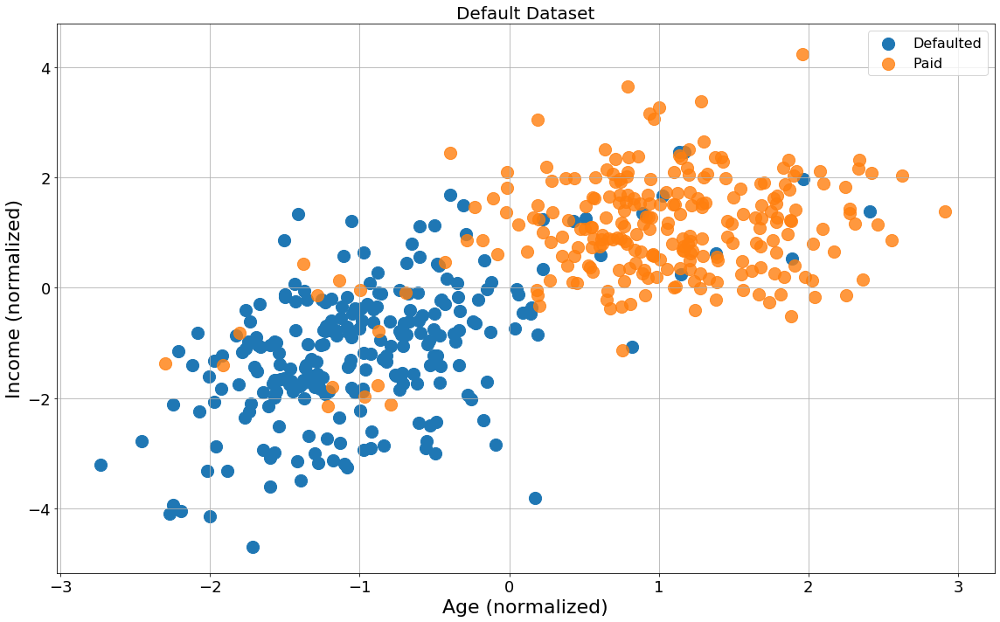

In [7]:
#I.N: See a sneak peek of the data plotted

plt.figure(figsize=(16, 10));
plt.grid(True);

ind_d = y==1
ind_p = y==0
plt.scatter(X[ind_d,0], X[ind_d,1], marker='o', s=200, label='Defaulted');
plt.scatter(X[ind_p,0], X[ind_p,1], marker='o', s=200, label="Paid", alpha=0.8);

plt.legend(fontsize=16);
plt.title("Default Dataset", fontsize=20);
plt.xlabel('Age (normalized)', fontsize=22);
plt.ylabel('Income (normalized)', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-data.png');

In [10]:
X.shape #I.N: we have 500 records by 2 features (age & income)
X[1:10,:]  #I.N: preview 10 feature rows
y.shape #I.N: 500 labels corresponding to our 500 recoreds
y[1:10]
df.head(15) #preview first 15 instances of the df

(500, 2)

array([[ 0.74812629,  1.18589022],
       [-1.64575979, -2.9333321 ],
       [ 0.27982946,  0.83540131],
       [ 0.19585293,  1.24920912],
       [-1.35705338, -1.4091226 ],
       [-0.49425018, -3.00562239],
       [-1.37872953,  0.4408266 ],
       [ 1.14567439,  0.24986299],
       [ 0.96821192,  0.57301515]])

(500,)

array([1, 0, 0, 1, 1, 0, 1, 0, 0])

,Age,Income,Default
0,0.748126,1.185890,0
1,-1.645760,-2.933332,1
2,0.279829,0.835401,0
3,0.195853,1.249209,0
4,-1.357053,-1.409123,1
5,-0.494250,-3.005622,1
6,-1.378730,0.440827,0
7,1.145674,0.249863,1
8,0.968212,0.573015,0
9,1.562058,-0.046012,0


## Profile the Data

In [7]:
#I.N: descriptive summary statistic report of the df (highlights missing values, variable types, etc.)

import pandas_profiling

pandas_profiling.ProfileReport(df, check_correlation=False)

C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use(BACKEND)


Number of variables,3
Number of observations,500
Total Missing (%),0.0%
Total size in memory,9.8 KiB
Average record size in memory,20.2 B
Numeric,2
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,0


C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


FeatureCorrelation(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E320F96288>,
                   color=None, feature_index=None, feature_names=None,
                   labels=None, method='mutual_info-classification', sort=True)

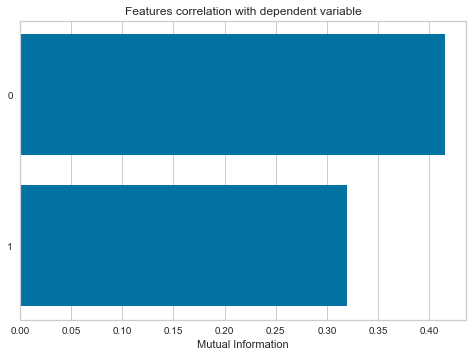

In [15]:
#I.N: FeatureCorrelation from yellowbrick library examines how correlated features are to the target

from yellowbrick.target import FeatureCorrelation

visualizer = FeatureCorrelation(method='mutual_info-classification', sort=True) #I.N: would use mutual_info-regression for regression problems
visualizer.fit(X, y, random_state=0) #I.N: fit to our data
visualizer.poof() #I.N: shows the plot?

#observations: it looks as though features have higher correlation with instances that end up not defaulting

## Plot the Data

C:\Users\ianno\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\ianno\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


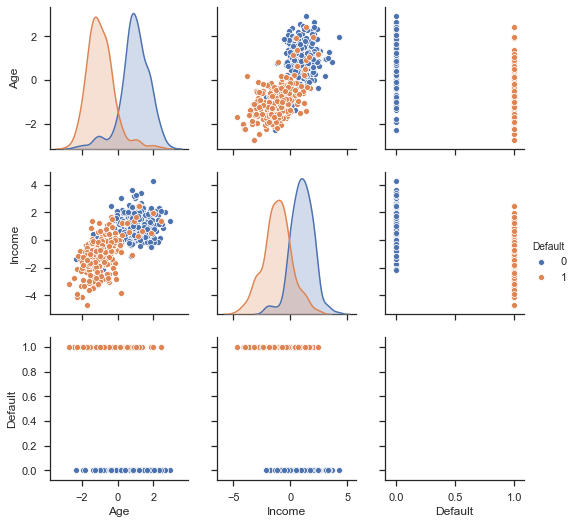

In [16]:
import seaborn as sns
sns.set(style="ticks")

sns.pairplot(df, hue="Default");

# Splitting the Data

In [17]:
from sklearn.model_selection import train_test_split

In [18]:
#I.N: split our data into train/test splits where X are the features and y are labels (4 total matrices)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
#preview the training features
X_train

array([[ 1.29222249e+00,  5.82978599e-01],
       [ 1.91370841e+00,  1.40993435e+00],
       [ 1.37480411e+00,  2.37273807e+00],
       [-2.30188062e+00, -1.37169280e+00],
       [-2.53734176e-01, -2.01702313e+00],
       [-3.57728806e-01, -9.72124403e-01],
       [-1.29776695e+00, -3.00335469e+00],
       [-1.35101393e+00, -2.10343998e-01],
       [ 1.38463627e+00,  5.62197857e-01],
       [-1.05647428e+00, -1.80823447e+00],
       [-1.18486685e+00, -1.79040549e+00],
       [ 1.16945112e+00,  2.46206917e+00],
       [ 1.61989209e+00,  3.01353959e-01],
       [-5.56753771e-01, -2.91157037e+00],
       [ 1.02329442e+00,  1.66837945e+00],
       [ 6.59102878e-01, -4.92594995e-02],
       [ 9.37627457e-01,  1.06174001e+00],
       [-1.80837088e+00, -1.74890096e+00],
       [ 1.88977492e-01,  1.49340633e+00],
       [-2.08469707e+00, -8.16403541e-01],
       [-1.24293523e+00, -7.66815028e-01],
       [-9.81863293e-01, -1.87299588e+00],
       [ 1.92131473e+00,  2.11820260e+00],
       [-1.

# Helper Functions for Plotting Decision Boundary, etc.

In [24]:
from matplotlib.colors import ListedColormap
from sklearn.metrics import roc_curve, auc

# Adopted from: https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

def plot_boundaries(X_train, X_test, y_train, y_test, clf, clf_name, ax, hide_ticks=True):
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])

    X = np.concatenate((X_train, X_test), axis=0)
    y = np.concatenate((y_train, y_test), axis=0)
    
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02));
    
    
    score = clf.score(X_test, y_test);

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    if hasattr(clf, "decision_function"):
        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]);
    else:
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1];

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, cmap=cm, alpha=.8);

    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, s=100, cmap=cm_bright, edgecolors='k');
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=50, cmap=cm_bright, edgecolors='k', alpha=0.6);

    ax.set_xlim(xx.min(), xx.max());
    ax.set_ylim(yy.min(), yy.max());
    if hide_ticks:
        ax.set_xticks(());
        ax.set_yticks(());
    else:
        ax.tick_params(axis='both', which='major', labelsize=18)
        #ax.yticks(fontsize=18);
        
    ax.set_title(clf_name, fontsize=28);
    ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'), size=35, horizontalalignment='right');
    ax.grid();
    
    


def plot_roc(clf, X_test, y_test, name, ax, show_thresholds=True):
    y_pred_rf = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thr = roc_curve(y_test, y_pred_rf)

    ax.plot([0, 1], [0, 1], 'k--');
    ax.plot(fpr, tpr, label='{}, AUC={:.2f}'.format(name, auc(fpr, tpr)));
    ax.scatter(fpr, tpr);

    if show_thresholds:
        for i, th in enumerate(thr):
            ax.text(x=fpr[i], y=tpr[i], s="{:.2f}".format(th), fontsize=14, 
                     horizontalalignment='left', verticalalignment='top', color='black',
                     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.1));
        
    ax.set_xlabel('False positive rate', fontsize=18);
    ax.set_ylabel('True positive rate', fontsize=18);
    ax.tick_params(axis='both', which='major', labelsize=18);
    ax.grid(True);
    ax.set_title('ROC Curve', fontsize=18)

# Decision Trees

In [26]:
#I.N: import DecisionTreeClassifier from scikit

from sklearn.tree import DecisionTreeClassifier

In [27]:
#I.N: setting criterion to 'entropy' is to use information gain ('gini' for gini impurity)

clf = DecisionTreeClassifier(random_state=42, criterion="entropy",
                             min_samples_split=10, min_samples_leaf=10, max_depth=3, max_leaf_nodes=5)

clf.fit(X_train, y_train) #I.N: fit the decision tree to our training data

y_pred_dt = clf.predict(X_test) #I.N: use the decision tree to predict labels for our test set

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=5,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [28]:
feature_names = X1.columns
class_names = [str(x) for x in clf.classes_]

## Use the Model to Predict Someone New

In [29]:
clf.predict_proba([[2, 2]])
clf.predict([[2, 2]])

array([[0.93922652, 0.06077348]])

array([0])

## Model Parameters

Surpisingly, sci-kit learn does not have a function to print the decision tree in text format. (It does have a way to graphical render the three, which we'll do later.) For now, we'll just print a few stats about the tree.

In [30]:
print(clf.tree_.node_count)
print(clf.tree_.impurity)
print(clf.tree_.children_left)
print(clf.tree_.threshold)

9
[0.99971144 0.40077522 0.45449306 0.99107606 0.33050773 0.22746906
 0.83147439 0.28998605 0.        ]
[ 1  5  3 -1 -1  7 -1 -1 -1]
[-0.05775159 -0.15540861  0.2254563  -2.         -2.         -0.7764757
 -2.         -2.         -2.        ]


## Model Performance

In [34]:
X_test.shape

(100, 2)

In [33]:
from sklearn.metrics import confusion_matrix

print(confusion_matrix(y_test, y_pred_dt))

#observations: 90% accuracy from decision tree classifier

[[50  5]
 [ 5 40]]


In [35]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_dt, target_names=class_names))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91        55
           1       0.89      0.89      0.89        45

    accuracy                           0.90       100
   macro avg       0.90      0.90      0.90       100
weighted avg       0.90      0.90      0.90       100



In [36]:
#I.N: calculate other accuracy metrics (accuracy above as well)

from sklearn.metrics import accuracy_score, cohen_kappa_score, f1_score, log_loss

print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_dt)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_dt)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_dt)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_dt)))

Accuracy = 0.90
Kappa = 0.80
F1 Score = 0.89
Log Loss = 3.45


C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ClassificationReport(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E324292408>,
                     classes=['0', '1'],
                     cmap=<matplotlib.colors.ListedColormap object at 0x000001E3243EC408>,
                     encoder=None, force_model=False, is_fitted='auto',
                     model=None, support=True)

0.9

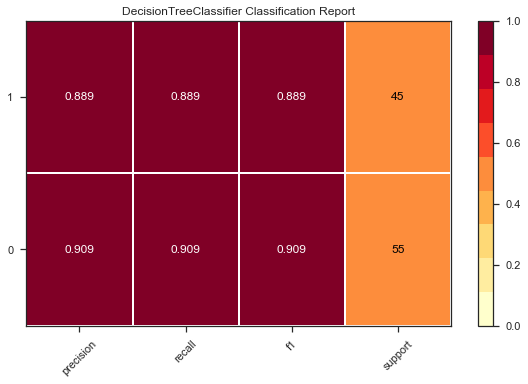

In [37]:
#I.N: this is a visual classification report (same info as classification_report from sklearn.metrics above)

from yellowbrick.classifier import ClassificationReport

# Instantiate the classification model and visualizer
visualizer = ClassificationReport(clf, classes=class_names, support=True)

visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

ClassPredictionError(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000002469271E400>,
           classes=None, model=None)

0.9

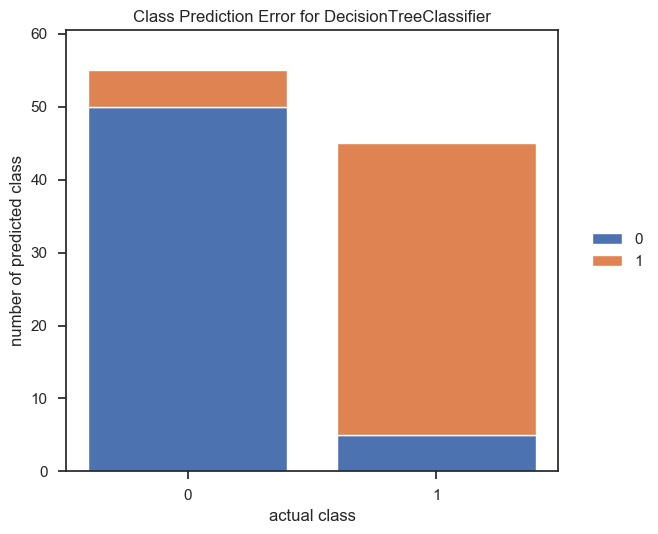

In [20]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(clf, classes=class_names)

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
g = visualizer.poof()

### ROC Curve

#### With YellowBrick

In [41]:
#I.N: import ROC curve from yellowbrick library
from yellowbrick.classifier import ROCAUC

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E3246188C8>,
       classes=['0', '1'], encoder=None, force_model=False, is_fitted='auto',
       macro=True, micro=True, model=None, per_class=True)

0.9462626262626262

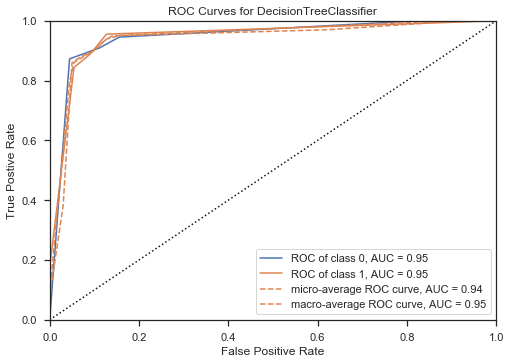

In [46]:
#I.N: plot our decision tree model's ROC curve
visualizer = ROCAUC(clf, classes=class_names)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

#### Manual

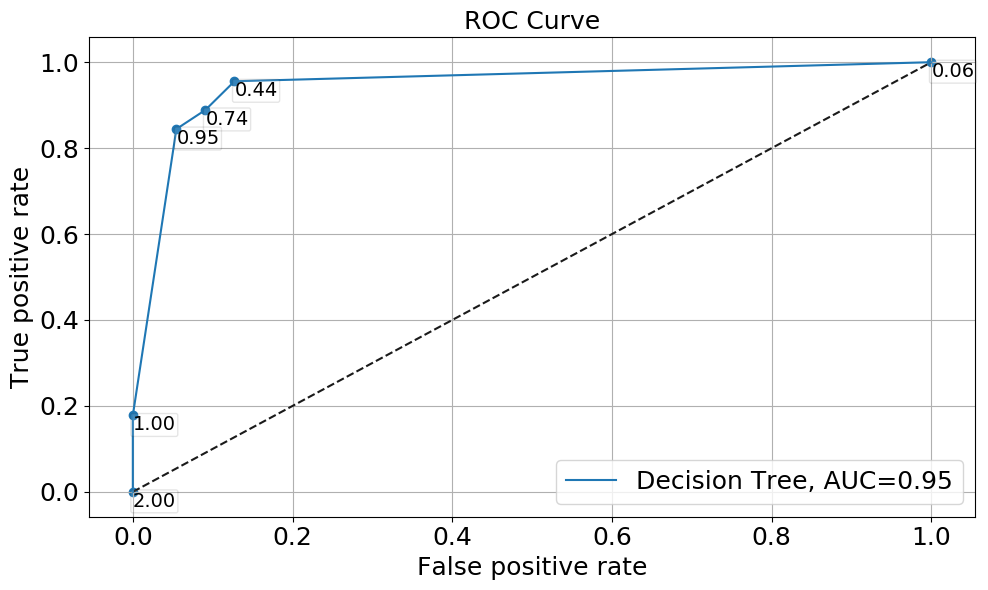

In [22]:
plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(clf, X_test, y_test, "Decision Tree", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
plt.savefig('out/default-dt-roc.png');

### Precision Recall Curve

#### With YellowBrick

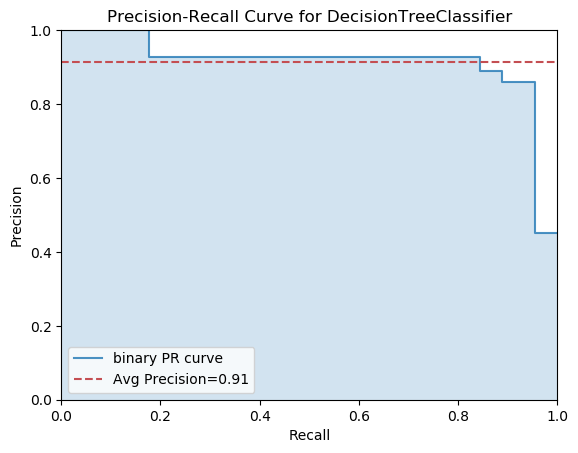

In [23]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(clf);
viz.fit(X_train, y_train);
viz.score(X_test, y_test);
viz.poof();

### Discrimintation Threshold

DiscriminationThreshold(argmax='fscore',
            ax=<matplotlib.axes._subplots.AxesSubplot object at 0x0000024692348908>,
            cv=0.1, exclude=None, fbeta=1.0, model=None, n_trials=50,
            quantiles=array([0.1, 0.5, 0.9]), random_state=None)

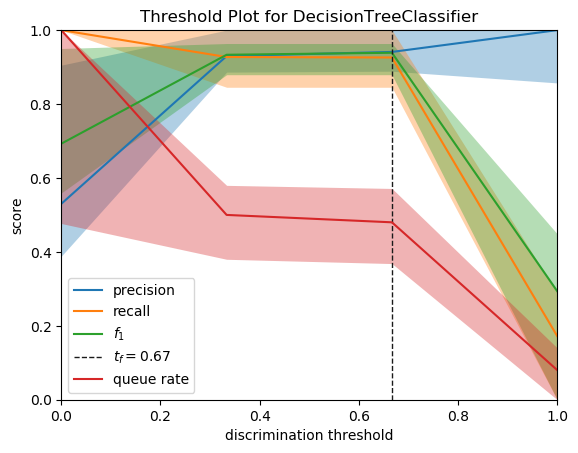

In [24]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(clf)
visualizer.fit(X, y)  # Fit the training data to the visualizer
visualizer.poof()     # Draw/show/poof the data

## Model Visualization

In [54]:
#I.N: this is to visualize our decision tree model (getting an error due to file directory?)

from sklearn.tree import export_graphviz
import graphviz

base='default_dt_graph'
dot = base + '.dot'
png = base + '.png'

dot_data = export_graphviz(clf, out_file=dot, feature_names=feature_names, class_names=class_names,  
                      filled=True, rounded=True, special_characters=True,
                      leaves_parallel=False, proportion=False)  
graph = graphviz.Source(dot_data)  

from subprocess import call
call(['dot', '-Tpng', dot, '-o', png, '-Gdpi=600'])


# Display in python
import matplotlib.pyplot as plt
plt.figure(figsize = (24, 28));
plt.imshow(plt.imread(png));
plt.axis('off');
plt.show();

FileNotFoundError: [WinError 2] The system cannot find the file specified

In [55]:
import importlib
spec = importlib.util.find_spec("dtreeviz")
dtreeviz_found = spec is not None

if dtreeviz_found:
    from dtreeviz.trees import *

    viz = dtreeviz(clf, X, y, target_name='Default', feature_names=feature_names, class_names=class_names, orientation ='LR'); 
    viz.save('out/default_dt_dtreeviz1.svg')
    viz
else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


In [56]:
if dtreeviz_found:
    viz = dtreeviz(clf, X, y, target_name='Default', feature_names=feature_names, class_names=class_names, orientation ='TD', fancy=False);
    viz.save('out/default_dt_dtreeviz2.svg')
    viz
else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


In [57]:

if dtreeviz_found:
    # Select a random sample
    x = X_train[13,:] 
    print(x)
    print(y_train[13])

    viz = dtreeviz(clf, X_train, y_train, target_name='default', feature_names=feature_names, class_names=class_names, orientation ='LR', X=x); 
    viz

else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


### Decision Boundary

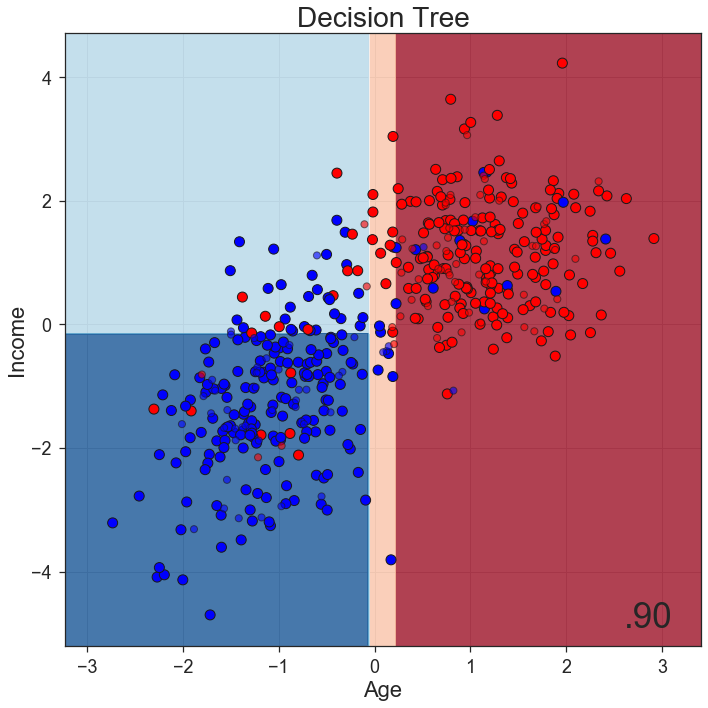

In [58]:
#I.N: generating plot showing the decision boundary for our decision tree model
#(this is the same plot that the prof has used repetitively when comparing model performance)

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, clf, "Decision Tree", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-dt-5-boundaries.png');

#observations: notice our accuracy of 90% is shown in bottom-right

## Model Selection

### Grid Search

In [60]:
#I.N: use grid search (from model_selection library) to evaluate how to tune hyperparemters in our decision tree

from sklearn.model_selection import GridSearchCV

parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}

treeclf = DecisionTreeClassifier(splitter='best', class_weight=None, random_state=42)
parameters = {'criterion':('gini', 'entropy'), 'max_depth':[2, 4, 6, 8, 10], 'min_samples_split':[2, 10, 50], 'min_samples_leaf':[1, 5, 10],
             'max_features':[None, 'auto'], 'max_leaf_nodes':[None, 5, 10, 50], 'min_impurity_decrease':[0, 0.1, 0.2]}

cv_clf = GridSearchCV(treeclf, parameters, scoring='roc_auc', cv=5, return_train_score=True) #I.N: note we've set cv=5 (5 fold) - this is the default
%time cv_clf.fit(X, y)

#observations: recall we initially used criterion=entropy, max_depth=3, min_samples_leaf=10, min_samples_split=10, max_leaf_nodes=5

Wall time: 26.7 s


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ('gini', 'entropy'),
                     

In [61]:
#I.N: let's now view our best parameters after performing grid search

cv_clf.best_params_
cv_clf.best_score_
cv_clf.best_estimator_ #I.N: here we refit our decision tree classifier using the optimal parameter values we've found

#observations: criterion=gini, max_depth=8, max_leaf_nodes=50, min_samples_leaf=5, min_samples_split=2;
#0.942 is the best score obtained in our gridsearch

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'auto',
 'max_leaf_nodes': 50,
 'min_impurity_decrease': 0,
 'min_samples_leaf': 5,
 'min_samples_split': 2}

0.9417159823929572

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=8, max_features='auto', max_leaf_nodes=50,
                       min_impurity_decrease=0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

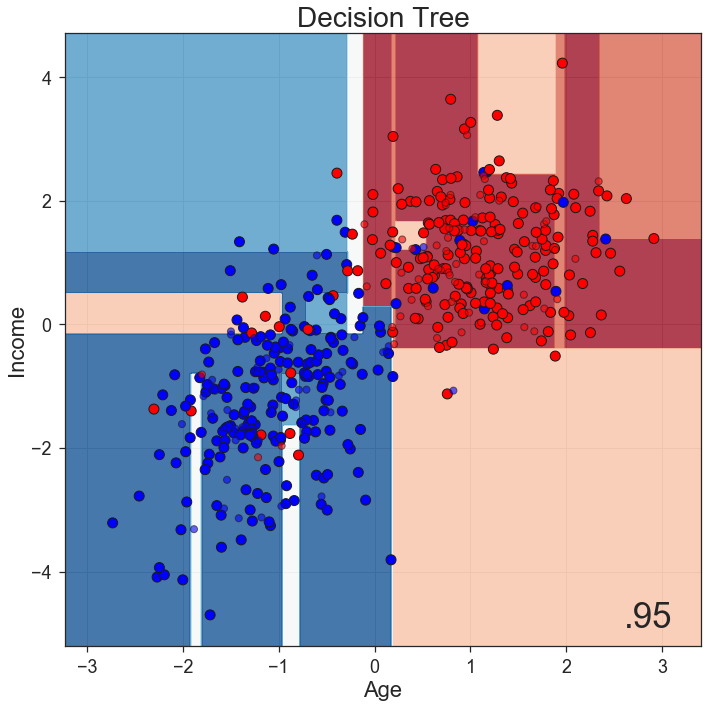

In [66]:
#I.N: once again, let's generate plot showing the decision boundary for our TUNED decision tree model

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, cv_clf.best_estimator_, "Decision Tree", ax, hide_ticks=False)
    #main change is in plot_boundaries where we call on cv_clf.best_estimator_ (instead of just the clf model from earlier)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-dt-best-boundaries.png');

#observations: accuracy has increase from 90% to 95% after hyperparameter tuning through grid search

In [33]:
if dtreeviz_found:
    viz = dtreeviz(cv_clf.best_estimator_, X, y, target_name='Default', feature_names=feature_names, class_names=class_names, orientation ='TD', fancy=False);
    viz

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ValidationCurve(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E3248E9248>,
                cv=10, groups=None, logx=False, model=None, n_jobs=1,
                param_name='max_depth',
                param_range=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                pre_dispatch='all', scoring='roc_auc')

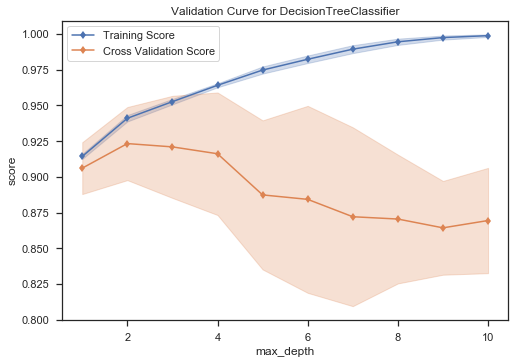

In [70]:
from yellowbrick.model_selection import ValidationCurve

viz = ValidationCurve(DecisionTreeClassifier(), param_name="max_depth", param_range=np.arange(1, 11), cv=10, scoring="roc_auc")
viz.fit(X, y)
#viz.poof(outpath='out/dt_validation_curve.png')
viz.poof()

# Naive Bayes

In [71]:
#I.N: import naive bayes classifier and fit to our data

from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb = gnb.fit(X_train, y_train)
gnb

y_pred_gnb = gnb.predict(X_test) #create predictions on our test set (recall these are the same train/test matrices we initially split)

GaussianNB(priors=None, var_smoothing=1e-09)

## Model Parameters

In [76]:
gnb.theta_ # Mean of each feature per class
gnb.sigma_ # Variance of each feature per class

array([[ 0.99887777,  1.06512859],
       [-0.91827636, -1.08561939]])

array([[0.70142311, 0.949339  ],
       [0.62737657, 1.68858577]])

## Model Performance

In [77]:
confusion_matrix(y_test, y_pred_gnb)

#observations: even stronger results than the dtree it seems

array([[51,  4],
       [ 2, 43]], dtype=int64)

In [80]:
print(classification_report(y_test, y_pred_gnb))

#observations: 94% accuracy

              precision    recall  f1-score   support

           0       0.96      0.93      0.94        55
           1       0.91      0.96      0.93        45

    accuracy                           0.94       100
   macro avg       0.94      0.94      0.94       100
weighted avg       0.94      0.94      0.94       100



In [81]:
print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_gnb)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_gnb)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_gnb)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_gnb)))

Accuracy = 0.94
Kappa = 0.88
F1 Score = 0.93
Log Loss = 2.07


C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=F

DiscriminationThreshold(argmax='fscore',
                        ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E3254A3CC8>,
                        cv=0.1, exclude=None, fbeta=1.0, force_model=None,
                        is_fitted='auto', model=None, n_trials=50,
                        quantiles=array([0.1, 0.5, 0.9]), random_state=None)

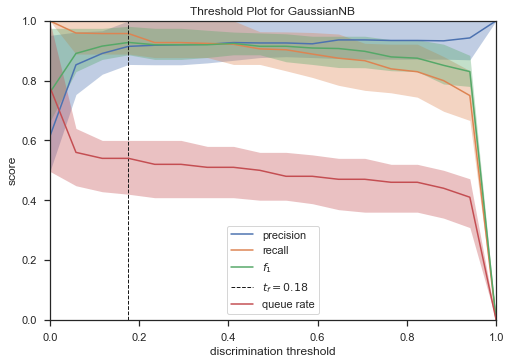

In [82]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(gnb)
visualizer.fit(X, y)  # Fit the training data to the visualizer
visualizer.poof()     # Draw/show/poof the data

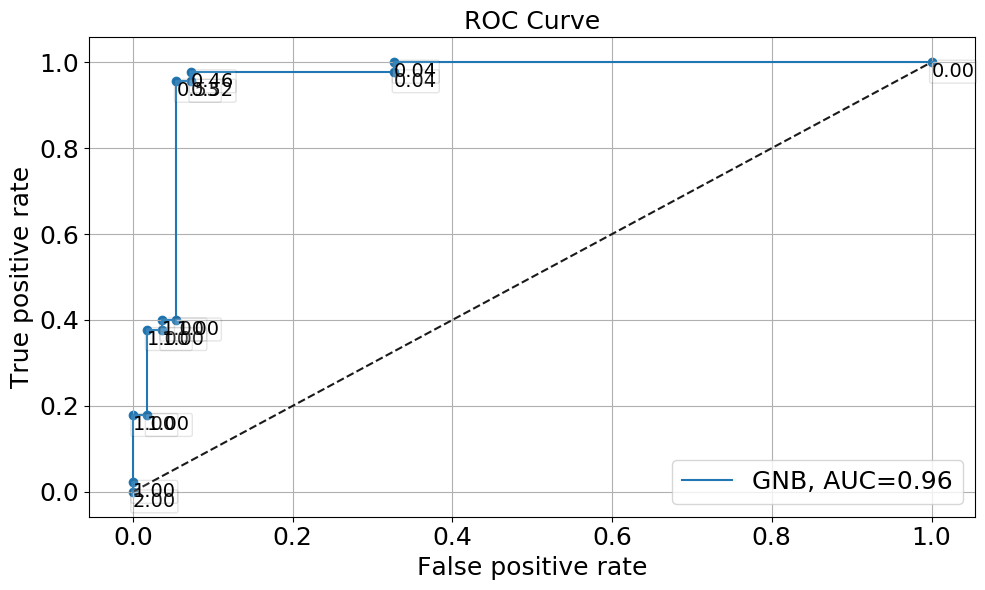

In [88]:
#I.N: manual plotting of the ROC curve

plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(gnb, X_test, y_test, "GNB", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-gnb-roc.png');

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E324BCD488>,
       classes=['0', '1'], encoder=None, force_model=False, is_fitted='auto',
       macro=True, micro=True, model=None, per_class=True)

0.9628129782675237

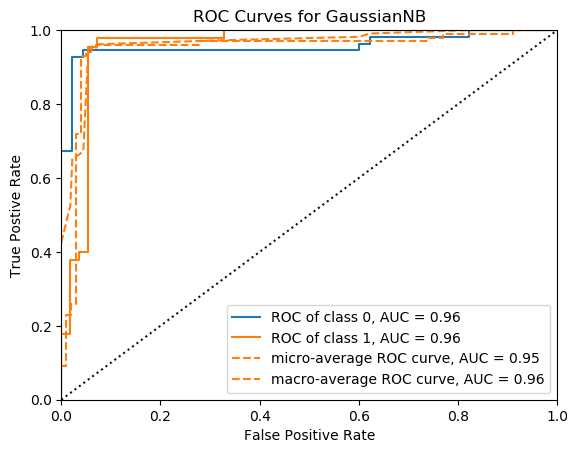

In [84]:
#I.N: plot our Naive Bayes model's ROC curve (from package)
visualizer = ROCAUC(gnb, classes=class_names)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof()                 # Draw/show/poof the data

## Model Visualization

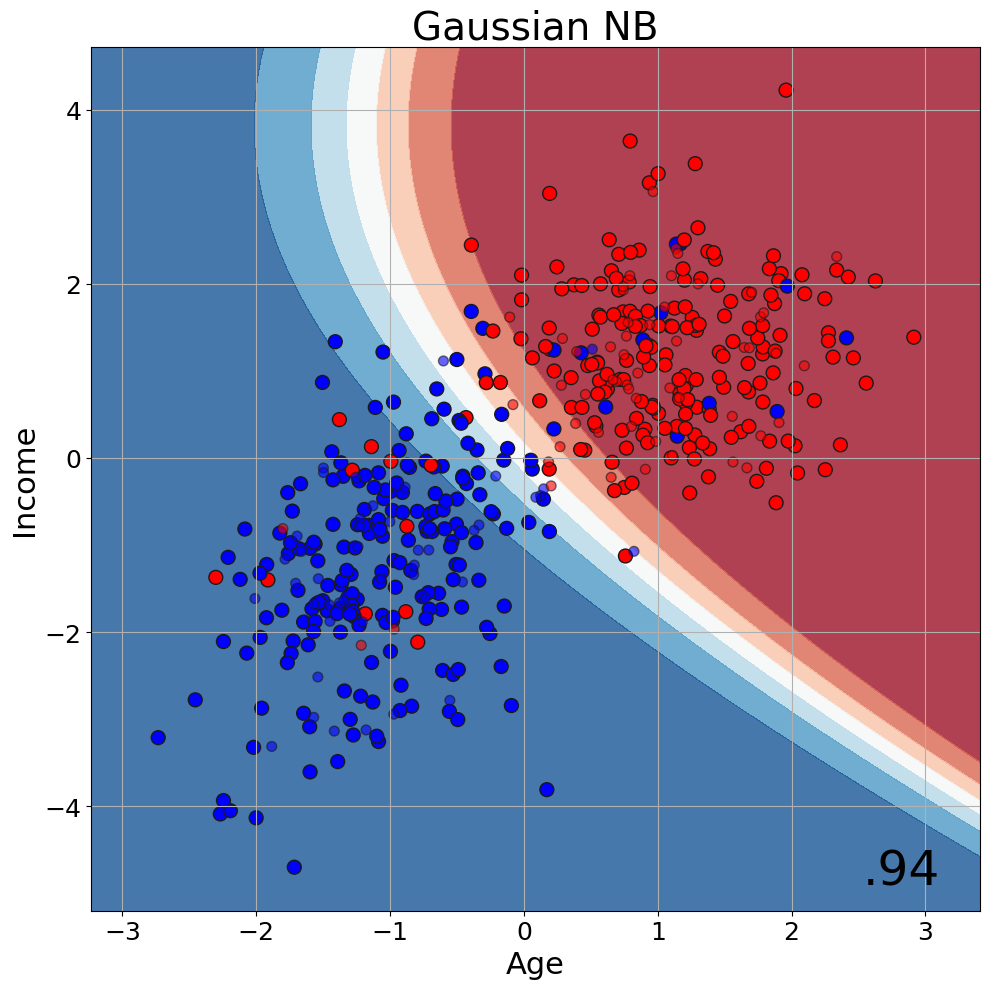

In [89]:
#I.N: Decision boundary plot for our Gaussian NB model (94% accuracy)

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, gnb, "Gaussian NB", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-gnb-boundaries.png');

# KNN

In [90]:
#import KNN classifier
from sklearn.neighbors import KNeighborsClassifier

In [121]:
#fit the KNN to our data
knn_clf = KNeighborsClassifier(n_neighbors=3) #set k = 3 at first
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [122]:
#use our fitted KNN model to predict on our test set
y_pred_knn = knn_clf.predict(X_test)

In [123]:
#I.N: sneak peek at our predictions on the test set
y_pred_knn

array([1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0])

## Model Parameters

In [124]:
knn_clf.effective_metric_
knn_clf.effective_metric_params_

'euclidean'

{}

## Model Performance

In [125]:
print(confusion_matrix(y_test, y_pred_knn))

[[47  8]
 [ 2 43]]


In [126]:
print(classification_report(y_test, y_pred_knn, target_names=class_names))

#observations: 90% accuracy

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        55
           1       0.84      0.96      0.90        45

    accuracy                           0.90       100
   macro avg       0.90      0.91      0.90       100
weighted avg       0.91      0.90      0.90       100



In [127]:
print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_knn)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_knn)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_knn)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_knn)))

Accuracy = 0.90
Kappa = 0.80
F1 Score = 0.90
Log Loss = 3.45


C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=F

DiscriminationThreshold(argmax='fscore',
                        ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E325218588>,
                        cv=0.1, exclude=None, fbeta=1.0, force_model=None,
                        is_fitted='auto', model=None, n_trials=50,
                        quantiles=array([0.1, 0.5, 0.9]), random_state=None)

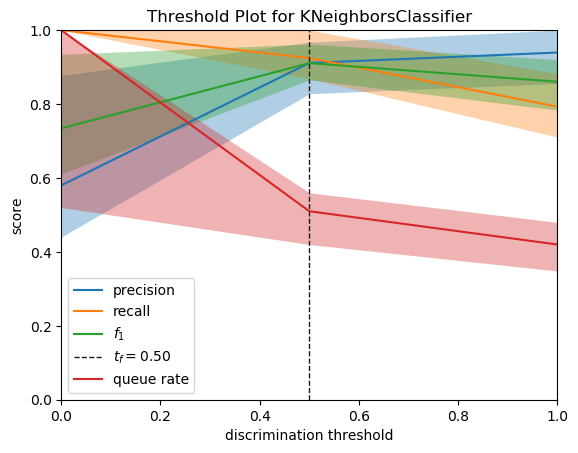

In [128]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(knn_clf)
visualizer.fit(X, y)  # Fit the training data to the visualizer
visualizer.poof()     # Draw/show/poof the data

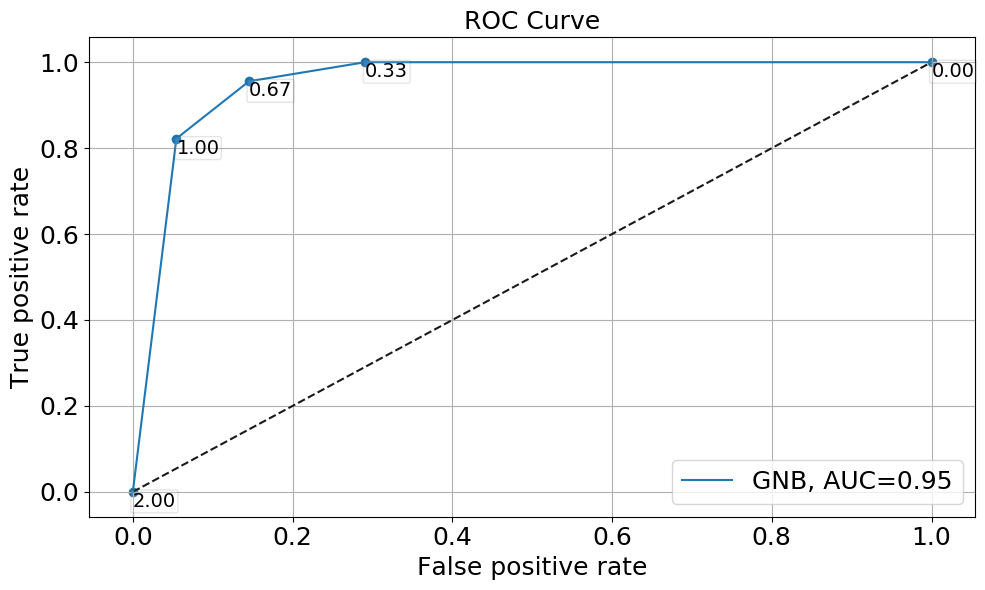

In [129]:
plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(knn_clf, X_test, y_test, "GNB", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-knn-roc.png');

#observations: 0.95 AUC

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E3251B4F48>,
       classes=['0', '1'], encoder=None, force_model=False, is_fitted='auto',
       macro=True, micro=True, model=None, per_class=True)

0.9545454545454546

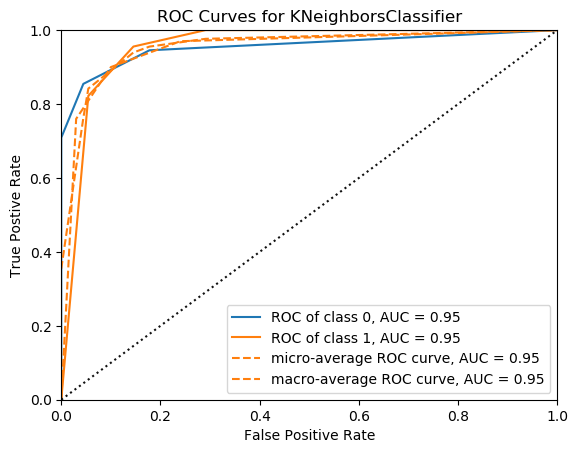

In [130]:
#I.N: test using the ROC from library
visualizer = ROCAUC(knn_clf, classes=class_names)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof()                 # Draw/show/poof the data

## Model Visualization

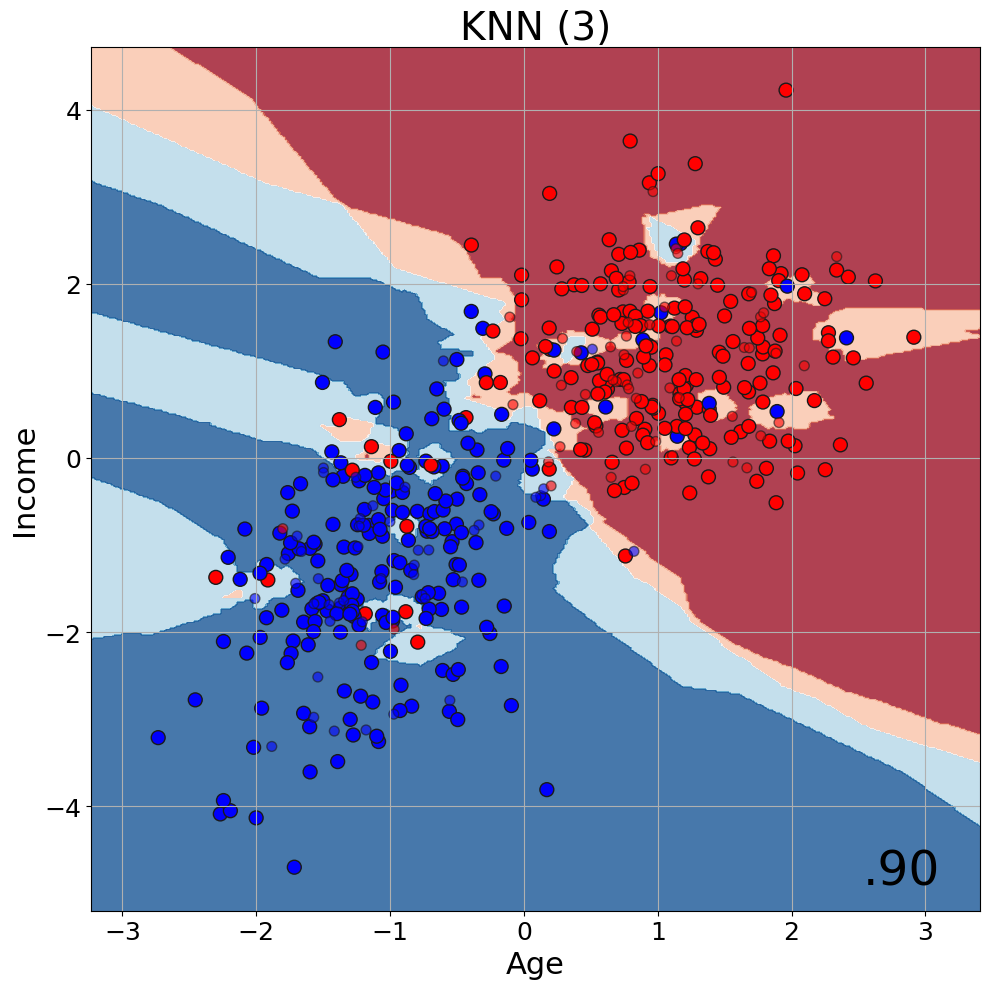

In [131]:
#I.N: Decision boundary plot for our KNN (k=3) model (90% accuracy)

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, knn_clf, "KNN (3)", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-knn-boundaries.png');

## Experimenting with Lots of Ks

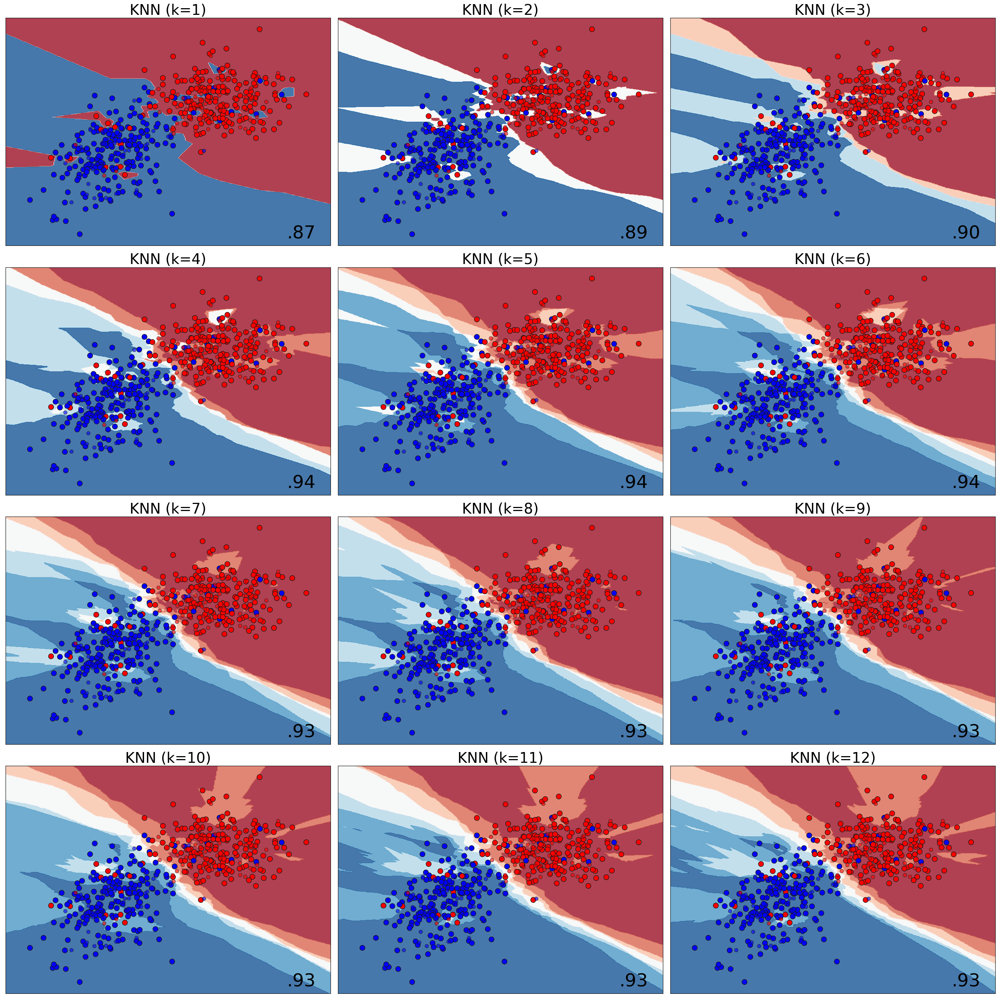

In [109]:
rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 27));
i = 1

ks = np.arange(1, 13)

for k in ks:
    ax = plt.subplot(4, 3, i);
    clf_tmp = KNeighborsClassifier(n_neighbors=k)
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, "KNN (k={:d})".format(k), ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-knn-all.png');

#observations: k=4,5,6 appear to result in optimal performance (94% accuracy)

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ValidationCurve(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001E326159D48>,
                cv=5, groups=None, logx=False, model=None, n_jobs=1,
                param_name='n_neighbors',
                param_range=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                pre_dispatch='all', scoring='roc_auc')

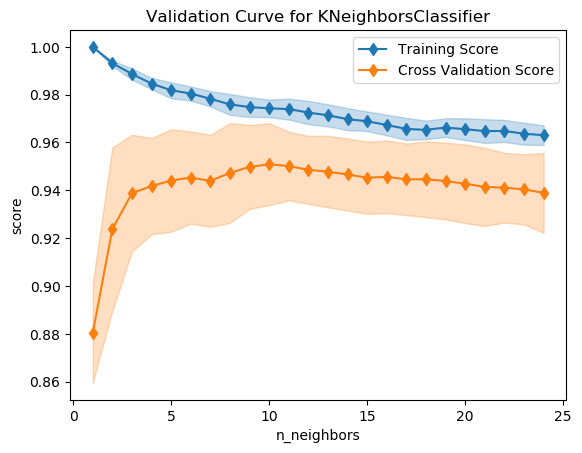

In [132]:
from yellowbrick.model_selection import ValidationCurve

viz = ValidationCurve(KNeighborsClassifier(), param_name="n_neighbors", param_range=np.arange(1, 25), cv=5, scoring="roc_auc")
viz.fit(X, y)
#viz.poof(outpath='out/default-knn-validation.png')
viz.poof()

# SVM - Linear

In [133]:
#import support vector machine
from sklearn.svm import SVC

In [134]:
#fit the SVM classifier to our data
svm_clf = SVC(kernel="linear", C=0.025) #choosing a random default C=0.025 here (will gridsearch later)
svm_clf.fit(X_train, y_train)

SVC(C=0.025, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [135]:
#predict using the fitted SVM classifier on our test data
y_pred_svm = svm_clf.predict(X_test)

In [136]:
#preview of the predictions
y_pred_svm

array([1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0])

## Model Parameters

In [137]:
svm_clf.n_support_ #I.N: no idea what this is...number of support vectors

array([70, 69])

In [140]:
svm_clf.support_vectors_ #I.N: these are the support vectors it looks like

array([[-2.30188062e+00, -1.37169280e+00],
       [-1.18486685e+00, -1.79040549e+00],
       [ 6.59102878e-01, -4.92594995e-02],
       [ 1.88977492e-01,  1.49340633e+00],
       [ 6.32255404e-02,  1.15016778e+00],
       [ 1.23912826e+00, -4.01893060e-01],
       [ 7.49980152e-01, -3.38768128e-01],
       [ 1.23622216e+00,  1.18585351e-01],
       [ 7.19460491e-01,  9.02795935e-01],
       [ 1.95852933e-01,  1.24920912e+00],
       [ 6.24289241e-01,  7.92790019e-01],
       [ 6.76905028e-01, -3.75127816e-01],
       [ 9.03792039e-01,  3.30215452e-01],
       [ 1.27385324e+00, -1.12810817e-02],
       [-8.82249296e-01, -1.76640750e+00],
       [-2.19281611e-02,  1.37013900e+00],
       [ 6.18149343e-01,  8.72452885e-01],
       [ 7.33559474e-01,  3.18524739e-01],
       [ 5.64698788e-01,  8.86571007e-01],
       [-1.13932834e+00,  1.30141500e-01],
       [ 8.88865699e-01,  2.62250487e-01],
       [-1.37872953e+00,  4.40826598e-01],
       [ 8.41265426e-01,  4.54384311e-01],
       [ 1.

In [141]:
svm_clf.dual_coef_ 

array([[-0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.00055246, -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.01900603, -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.0

In [142]:
svm_clf.intercept_ 

array([0.0853027])

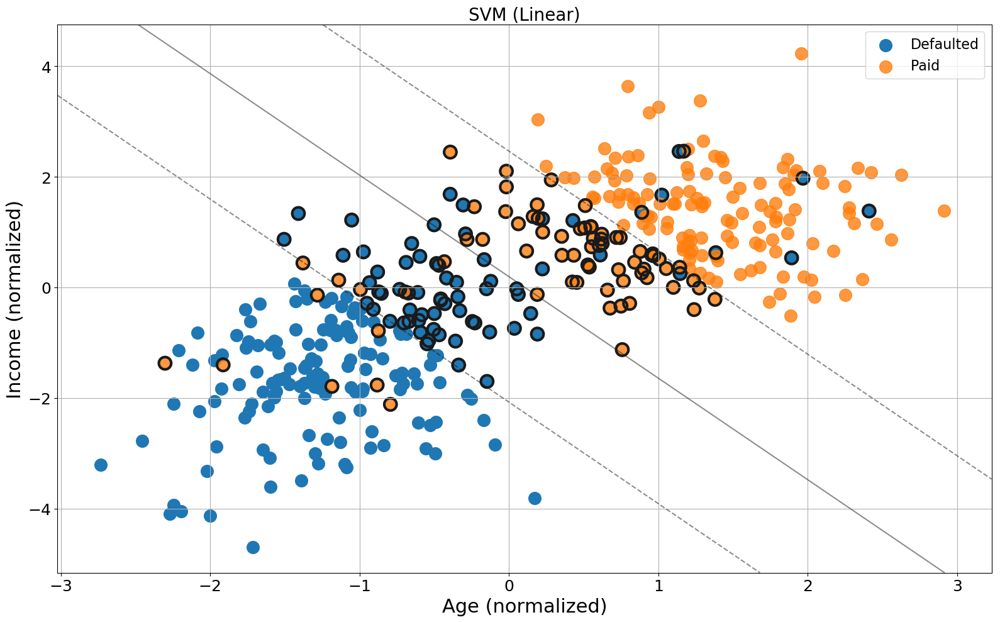

In [60]:
#I.N: HECTIC SVM plot (likely impossible to do with >2 dimensions/features)...just in this simplified example
#(SVM is too blackbox anyways to bother)

plt.figure(figsize=(16, 10));
plt.grid(True);

ind_d = y_train==1
ind_p = y_train==0
plt.scatter(X_train[ind_d,0], X_train[ind_d,1], marker='o', s=200, label='Defaulted');
plt.scatter(X_train[ind_p,0], X_train[ind_p,1], marker='o', s=200, label="Paid", alpha=0.8);

# plot the decision function
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# create grid to evaluate model
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = svm_clf.decision_function(xy).reshape(XX.shape)

# plot decision boundary and margins
ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

# plot support vectors
plt.scatter(svm_clf.support_vectors_[:, 0], svm_clf.support_vectors_[:, 1], s=200, linewidth=3, facecolors='none', edgecolors='k')

plt.legend(fontsize=16);
plt.title("SVM (Linear)", fontsize=20);
plt.xlabel('Age (normalized)', fontsize=22);
plt.ylabel('Income (normalized)', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.tight_layout();
plt.savefig('out/default-svm-support-vectors.png');

## Model Performance

In [144]:
print(confusion_matrix(y_test, y_pred_svm))

#observations: SVM's tend to perform very well...we see it again here!

[[51  4]
 [ 2 43]]


In [145]:
print(classification_report(y_test, y_pred_svm, target_names=class_names))

#observations: 94% accuracy

              precision    recall  f1-score   support

           0       0.96      0.93      0.94        55
           1       0.91      0.96      0.93        45

    accuracy                           0.94       100
   macro avg       0.94      0.94      0.94       100
weighted avg       0.94      0.94      0.94       100



In [147]:
print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_svm)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_svm)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_svm)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_svm)))

Accuracy = 0.94
Kappa = 0.88
F1 Score = 0.93
Log Loss = 2.07


## Model Visualization

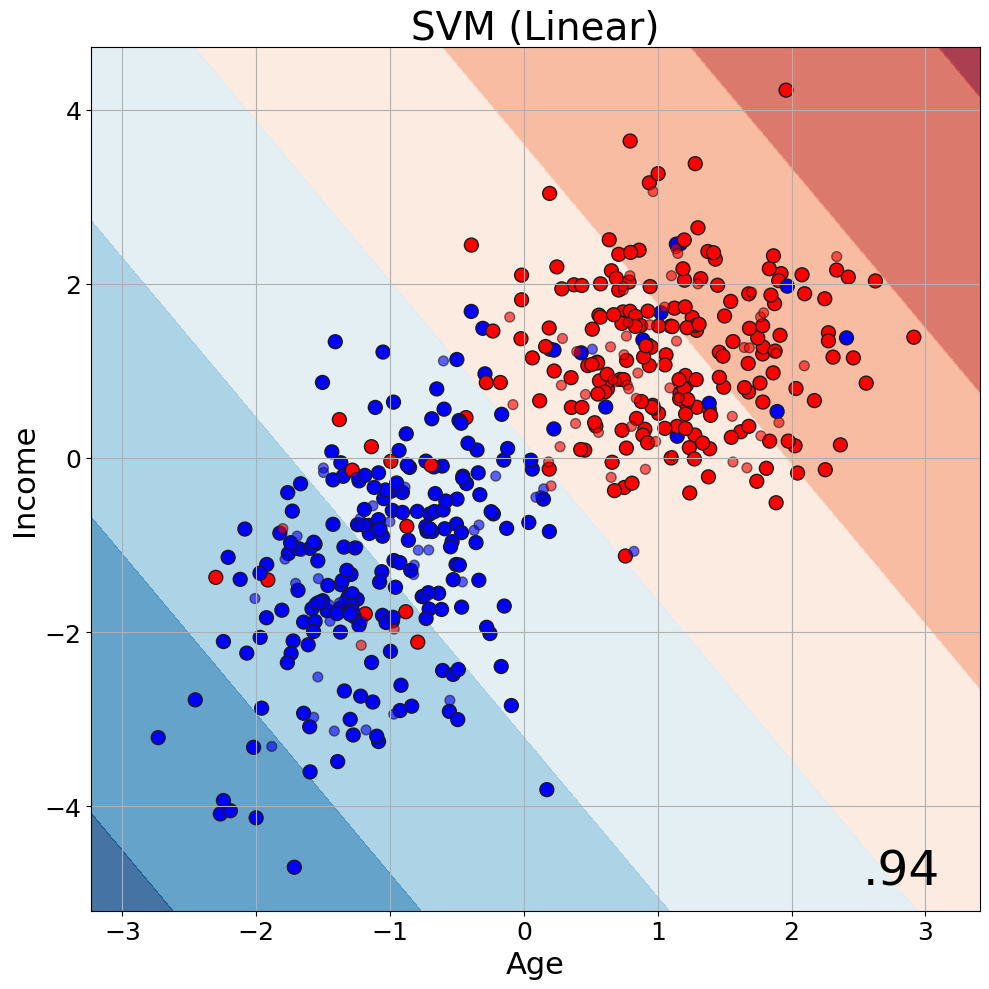

In [151]:
#I.N: decision boundary for our SVM (linear) model (94% accuracy)

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, svm_clf, "SVM (Linear)", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-svm-linear-boundaries.png');

## Experimenting with Different Kernels

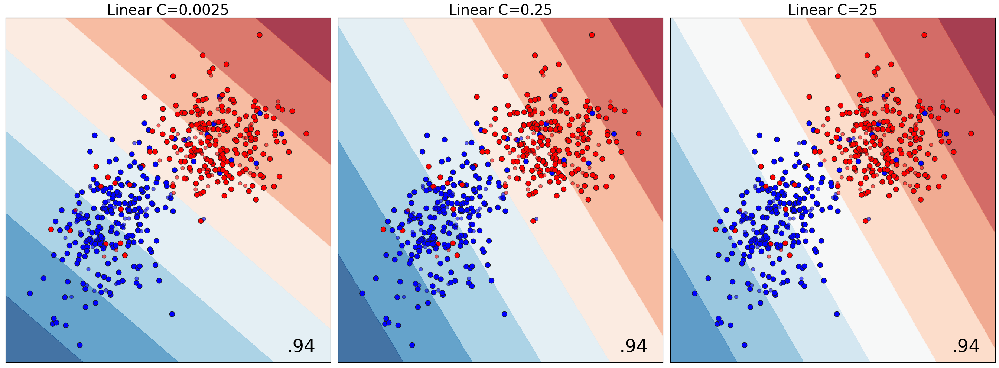

In [152]:
#I.N: recall how we set C = 0.025

names = ["Linear C=0.0025", "Linear C=0.25", "Linear C=25"]

classifiers = [
    SVC(kernel="linear", C=0.0025),
    SVC(kernel="linear", C=0.25),
    SVC(kernel="linear", C=25),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-linear-all.png');

#observations: doesn't look like there's much of a difference in performance dependent on how we tune C

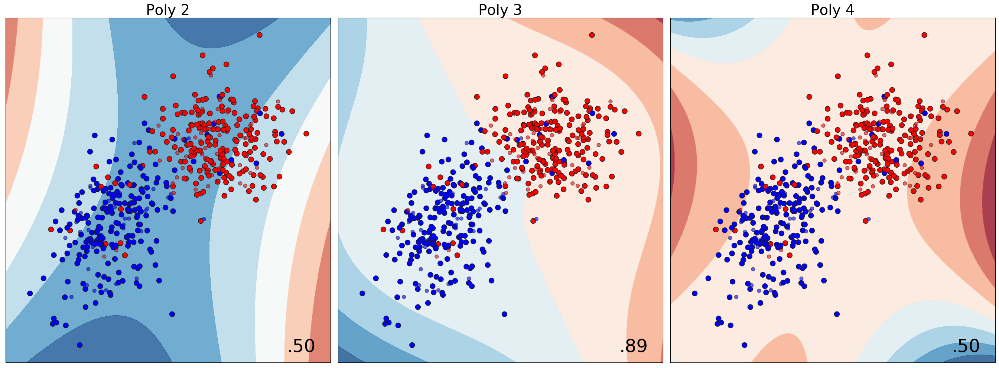

In [153]:
#I.N: testing polynomial SVM out of interest (addition of the degree parameter)

names = ["Poly 2", "Poly 3", "Poly 4"]

classifiers = [
    SVC(kernel="poly", degree=2, C=0.25),
    SVC(kernel="poly", degree=3, C=1),
    SVC(kernel="poly", degree=4, C=1),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-poly-all.png');

#observations: All are inferior to the linear SVM we've created, though Poly 3 is the closest at 89% accuracy

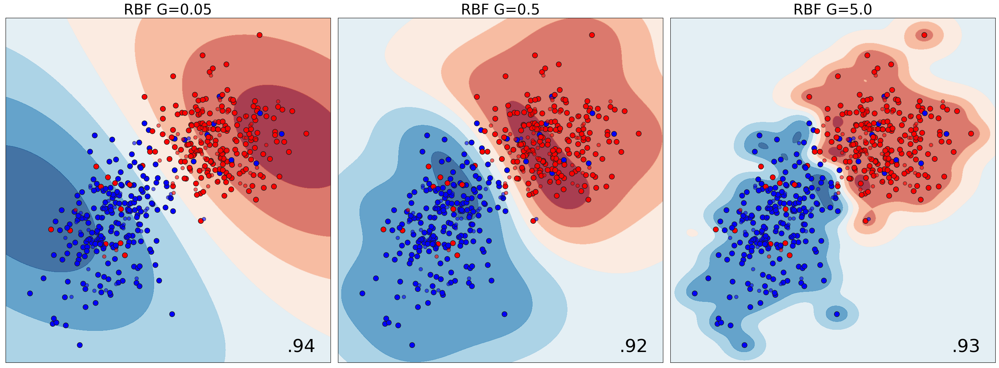

In [156]:
#I.N: testing RBF SVM out of interest (addition of the gamma parameter)

names = ["RBF G=0.05", "RBF G=0.5", "RBF G=5.0"]

classifiers = [
    SVC(kernel="rbf", gamma=0.05, C=1),
    SVC(kernel="rbf", gamma=0.5, C=1),
    SVC(kernel="rbf", gamma=5.0, C=1),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-rbf-all.png');

#observations: actually performs quite strongly (gamma = 0.05 nets 94% as well)

# NN

In [157]:
#import MLP (multi-layer perceptron) classifier from scikit neuralnet library
from sklearn.neural_network import MLPClassifier

In [203]:
#create and fit our neural net model to the data
nn_clf = MLPClassifier(solver='lbfgs', activation='relu', alpha=1e-3, hidden_layer_sizes=3, random_state=1, verbose=True)
    #I.N: could also use adam here like taught in udemy course (in this case lbfgs actually works better (I tested))

nn_clf.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=0.001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=3, learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=1, shuffle=True, solver='lbfgs',
              tol=0.0001, validation_fraction=0.1, verbose=True,
              warm_start=False)

In [204]:
#use the neural net to predict on our test set
y_pred_nn = nn_clf.predict(X_test)

In [205]:
#preview our predictions
y_pred_nn

array([1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0])

## Model Parameters

In [206]:
nn_clf.loss_

0.27106495217439325

In [207]:
nn_clf.n_layers_

3

In [208]:
w = nn_clf.coefs_ # The ith element in the list represents the weight matrix corresponding to layer i.
w

[array([[ 0.97565261,  1.08832584, -1.04406553],
        [-1.66548065, -1.62569206, -0.61746919]]), array([[ 3.91733103],
        [-2.57062872],
        [ 1.76672827]])]

In [209]:
b = nn_clf.intercepts_ # The ith element in the list represents the bias vector corresponding to layer i + 1.
b

[array([-2.08114864, -1.191515  ,  1.62527184]), array([-2.59817514])]

In [210]:
nn_clf.out_activation_

'logistic'

In [211]:
nn_clf.predict_proba([[0.5, 1]])

array([[0.85068094, 0.14931906]])

In [212]:
def relu_af(x):
    return max(0, x)
    
x = [0.5, 1]

layer_id=0
h0 = (x[0] * w[layer_id][0][0]) + ((x[1] * w[layer_id][1][0])) + (1 * b[layer_id][0])
print(h0)
print(relu_af(h0))

h1 = (x[0] * w[layer_id][0][1]) + ((x[1] * w[layer_id][1][1])) + (1 * b[layer_id][1])
print(h1)
print(relu_af(h1))

h2 = (x[0] * w[layer_id][0][2]) + ((x[1] * w[layer_id][1][2])) + (1 * b[layer_id][2])
print(h2)
print(relu_af(h2))

layer_id=1
o = (h0 * w[layer_id][0][0]) + ((h1 * w[layer_id][1][0])) + ((h2 * w[layer_id][2][0])) + (1 * b[layer_id][0])
print(o)
print(relu_af(o))

-3.258802984854219
0
-2.27304414130428
0
0.48576988136892907
0.48576988136892907
-8.662609270510957
0


## Model Performance

In [213]:
print(confusion_matrix(y_test, y_pred_nn))

[[51  4]
 [ 2 43]]


In [214]:
print(classification_report(y_test, y_pred_nn, target_names=class_names))

#observations: accuracy = 94% (was 90% using adam as solver)

              precision    recall  f1-score   support

           0       0.96      0.93      0.94        55
           1       0.91      0.96      0.93        45

    accuracy                           0.94       100
   macro avg       0.94      0.94      0.94       100
weighted avg       0.94      0.94      0.94       100



In [183]:
print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_nn)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_nn)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_nn)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_nn)))

Accuracy = 0.94
Kappa = 0.88
F1 Score = 0.93
Log Loss = 2.07


## Model Visualization

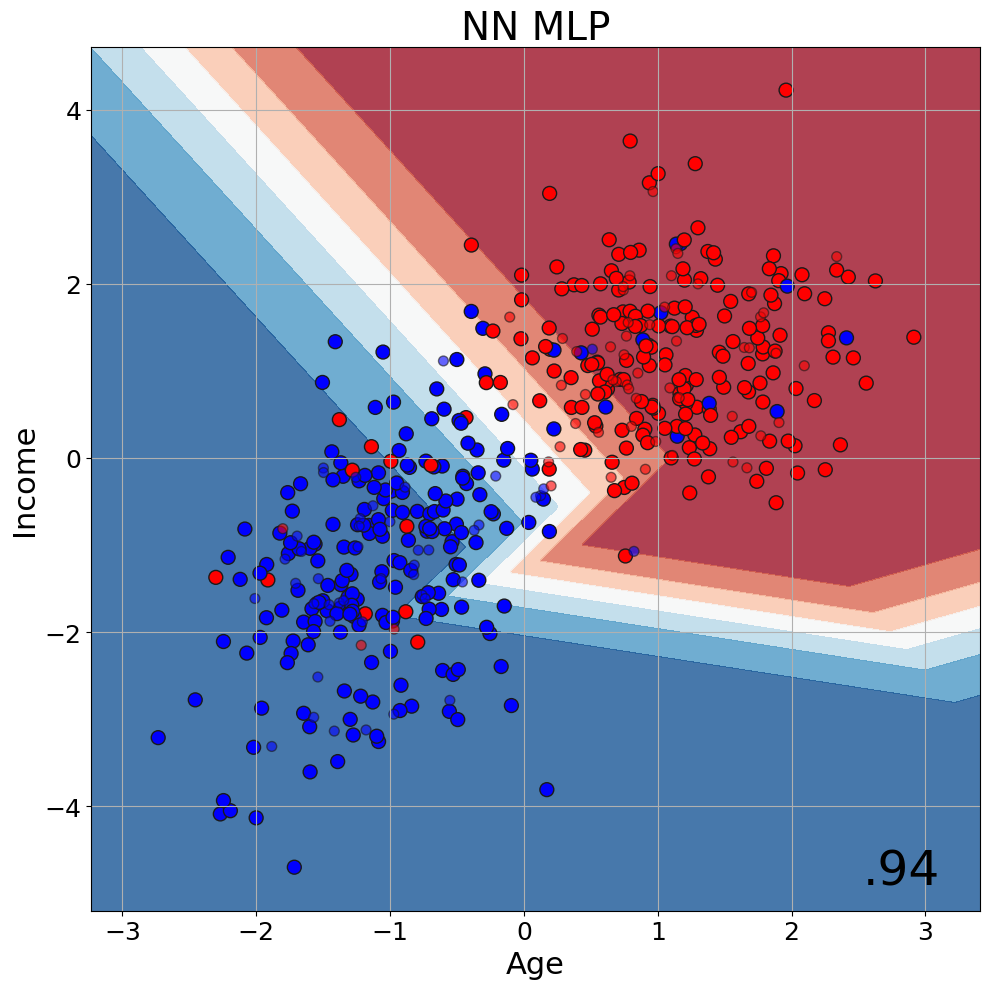

In [184]:
#I.N: decision boundary for our neural net multi-layer perceptron model (94% accuracy)

figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, nn_clf, "NN MLP", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-nn-mlp-boundaries.png');

## Experimenting with Mulitple Activation Functions

C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\ianno\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of I

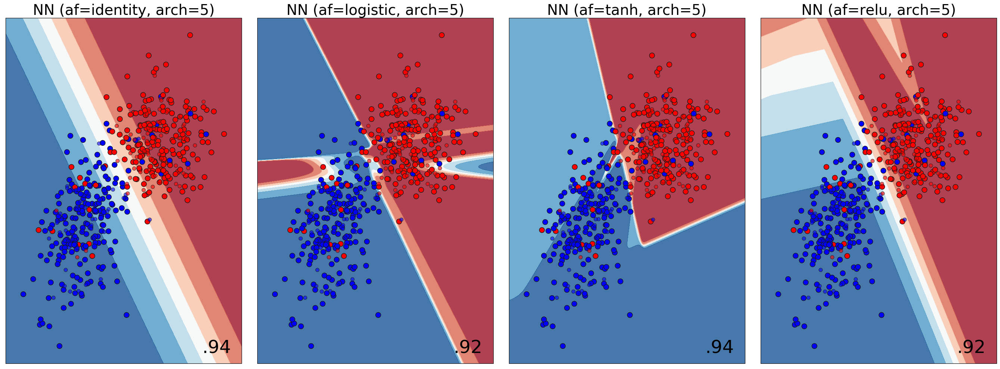

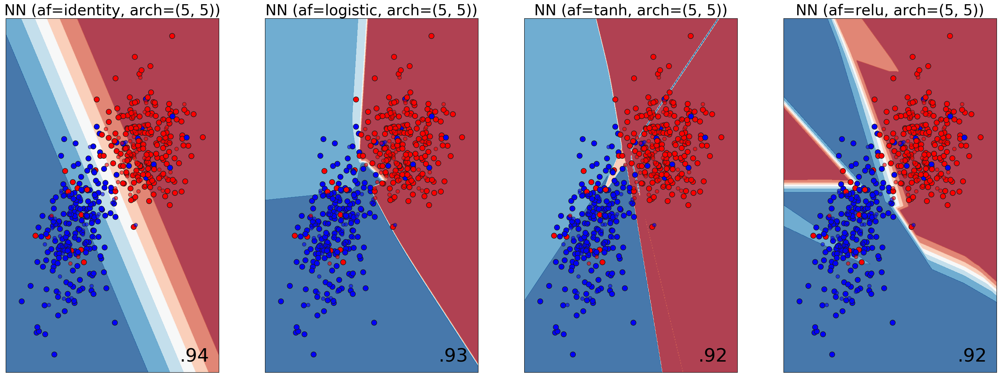

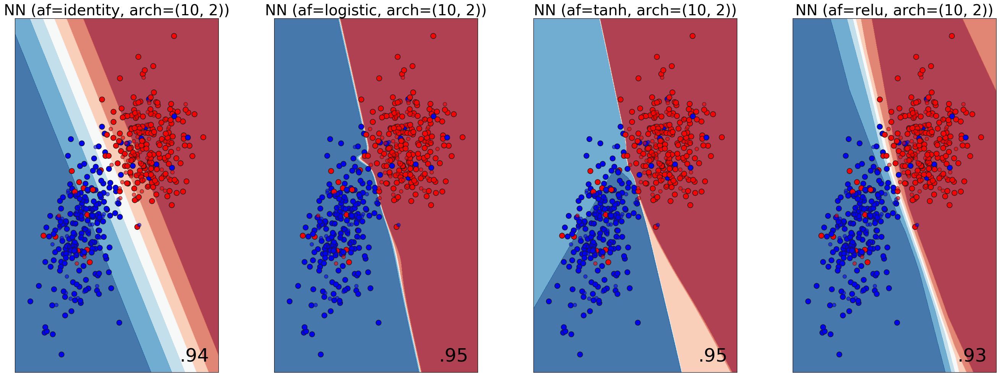

In [190]:
#I.N: recall we used relu earlier...let's try some of the others as well

rng = np.random.RandomState(2)

alpha=0.001
archs = [(5), (5, 5), (10, 2)]
afs = ['identity', 'logistic', 'tanh', 'relu']

j = 1

for arch in archs:
    figure = plt.figure(figsize=(27, 10));
    i = 1
    
    for af in afs:
        ax = plt.subplot(1, 4, i);
        clf_tmp = MLPClassifier(solver='lbfgs', activation=af, alpha=alpha, hidden_layer_sizes=arch, random_state=1);
        clf_tmp = clf_tmp.fit(X_train, y_train);
        plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, "NN (af={}, arch={})".format(af, arch, alpha), ax, hide_ticks=True);
        i += 1
        
    plt.tight_layout();
    #plt.savefig('out/default-nn-arch-{:d}-af.png'.format(j));
    j += 1

    #observations: logistic looks like it may work better (95% accuracy)

## Experimenting with Mulitple Alphas

[1.e-01 1.e-02 1.e-03 1.e-04 1.e-05 1.e-06 1.e-07 1.e-08 1.e-09 1.e-10
 1.e-11]


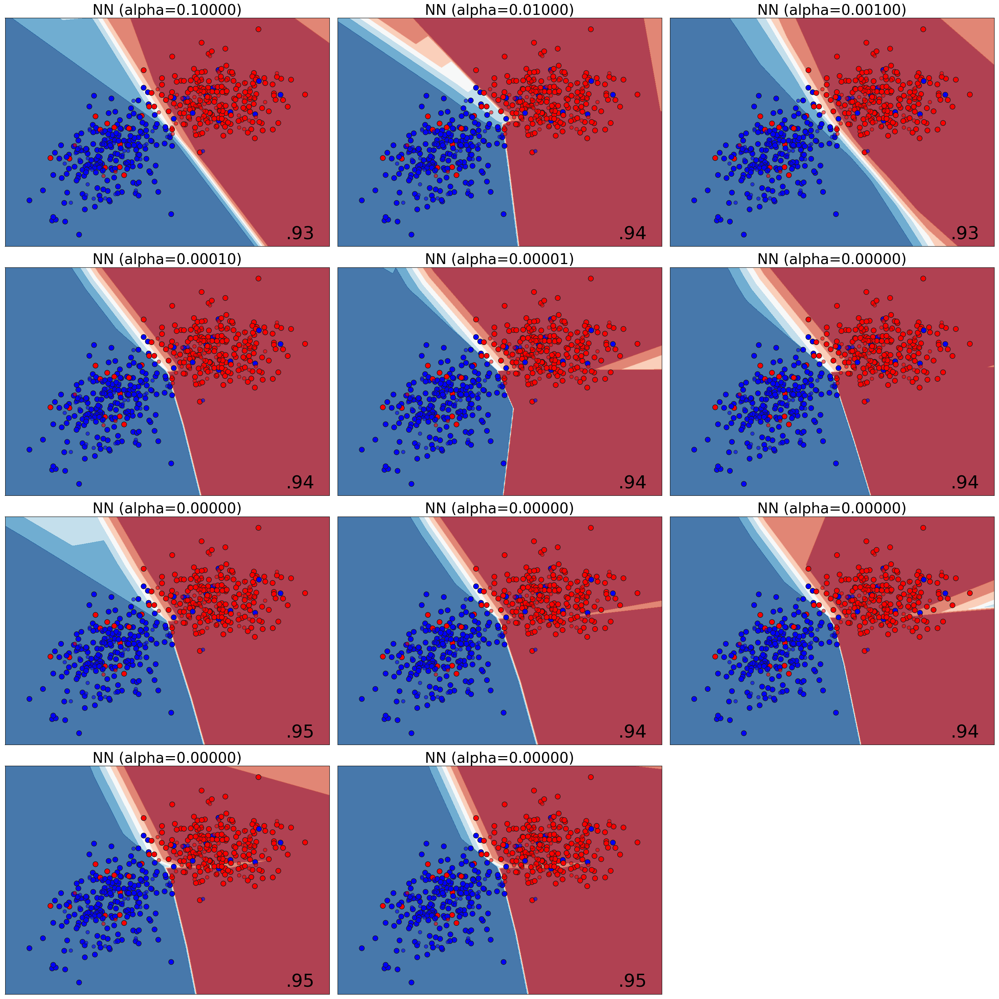

In [81]:
rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 27));
i = 1

alphas = 10.0 ** -np.arange(1, 12)
print(alphas)

for alpha in alphas:
    ax = plt.subplot(4, 3, i);
    clf_tmp = MLPClassifier(solver='lbfgs', activation='relu', alpha=alpha, hidden_layer_sizes=(10, 2), random_state=1)
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, "NN (alpha={:.5f})".format(alpha), ax, hide_ticks=True);
    i += 1

plt.tight_layout();
plt.savefig('out/default-nn-all.png');

# NN - Keras

In [224]:
#I.N: we learned ANN's using Keras in Python bootcamp

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
#from keras.utils import np_utils

model = Sequential() #I.N: create empty sequential model

model.add(Dense(3, input_dim=2, activation="relu")) #I.N: add in an individual layer (w/ relu activation)

model.add(Dense(1, activation='sigmoid')) #I.N: add in model end point - must have sigmoid activation as this is a classification problem

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy']) #I.N: select optimizer (adam) and loss function (binary_crossentropy for binary classification)

%time history = model.fit(X, y, validation_split=0.20, epochs=100, batch_size=10, verbose=0)

Wall time: 6.37 s


In [225]:
# list all data in history
print(history.history.keys())

figure = plt.figure(figsize=(12, 8));

plt.plot(history.history['acc']);
plt.plot(history.history['val_acc']);
plt.title('Keras Model Accuracy', fontsize=22);
plt.ylabel('accuracy', fontsize=18);
plt.xlabel('epoch', fontsize=18);
plt.xticks(fontsize=14);
plt.yticks(fontsize=14);
plt.ylim(bottom=0.85);
plt.legend(['train', 'test'], loc='upper left', fontsize=14);

plt.grid();
plt.tight_layout();
#plt.savefig('out/default-keras-accuracy.png');

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


KeyError: 'acc'

<Figure size 1200x800 with 0 Axes>

In [230]:
# calculate predictions
predictions = model.predict(X_test)
# round predictions
y_pred_keras = [round(x[0]) for x in predictions]
print(confusion_matrix(y_test, y_pred_keras))

[[51  4]
 [ 2 43]]


In [86]:
#from keras.utils import plot_model

#plot_model(model, to_file='out/default-keras-model.png', show_shapes=True, show_layer_names=True)

In [87]:
#from ann_visualizer.visualize import ann_viz

#ann_viz(model, view=True, filename='out/default-keras-ann.gv', title="Default Dataset")

# Comparing Multiple Algorithms

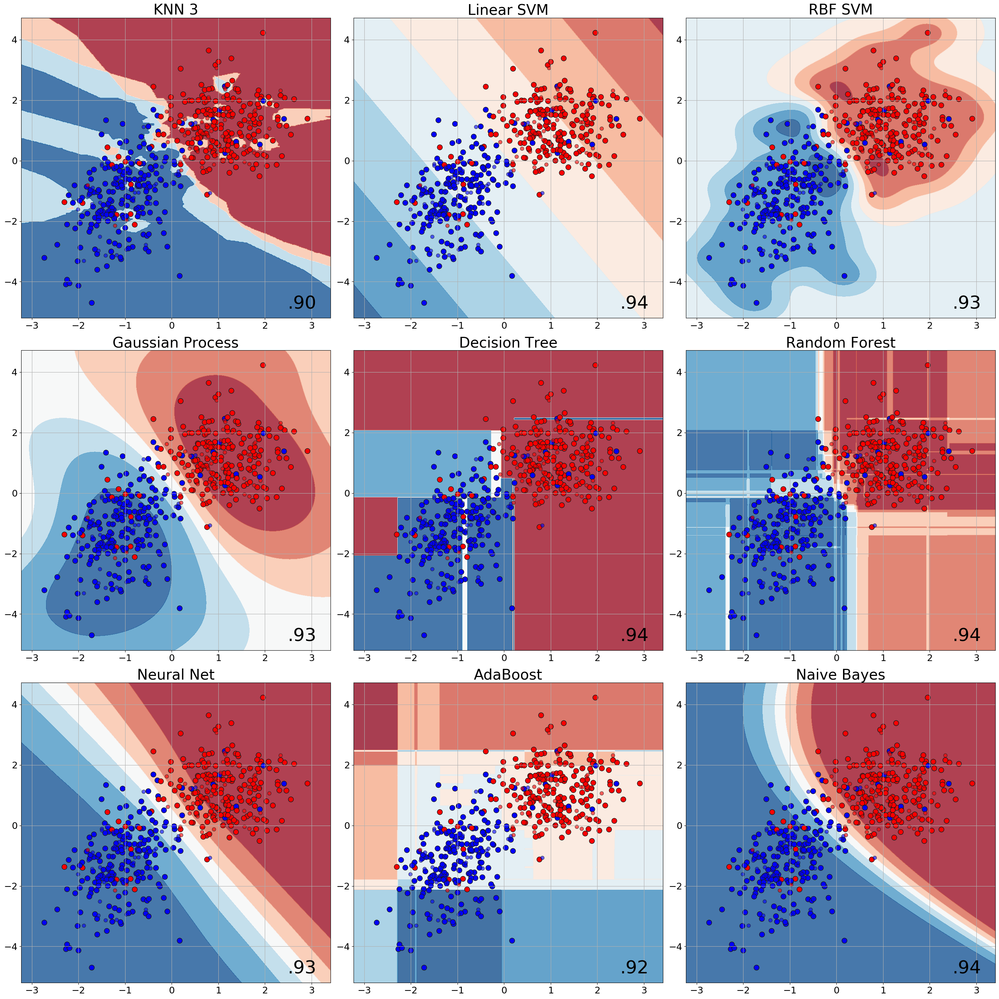

In [231]:
# Inspired by: https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis


names = ["KNN 3", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes"]

#I.N: Below we can plop in all our "competitor" models to compare nicely their respective decision boundaries and accuracies
classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1),
    AdaBoostClassifier(),
    GaussianNB()]


rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 27));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(3, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=False);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-all.png');